# Pokeamon Dataset

Welcome to your Pokémon machine learning challenge!

### Context:
You are given a dataset about various Pokémon characters. Your ultimate goal is to build a **classification model** that predicts whether a Pokémon is **Legendary** or **Not Legendary** based on its attributes.

### Tasks:

---

## Task 1: Load the Data
- Download the dataset using the provided code.
- Read the CSV file into a DataFrame.
- **File Name:** `Pokeamon_dataset.csv`

---

## Task 2: Explore the Data
- Display the first few rows of the dataset.
- Understand the meaning of each feature/column.
- Check for missing values and data types.
- **Goal:** Get familiar with the data you're working with.

---

## Task 3: Preprocess the Data
- **Cleaning:**
    - Handle any missing values.
    - Fix data types if needed.
- **Feature Engineering:**
    - Decide which features are important.
    - You may **remove** irrelevant features or **create** new ones.
    - **Justify** your choices.
- **Label Adjustment:**
    - Convert "Mythical" rarity into "Legendary" to make it a binary classification task.
    - Final target labels: "Legendary" and "Normal"

---

## Task 4: Prepare Data for Modeling
- Split the dataset into **training** and **testing** sets.
- Normalize or standardize features if necessary.

---

## Task 5: Train Your Model
- Choose a **non-Neural Network** machine learning model.
    - Examples: Decision Trees, Random Forests, SVM, Logistic Regression, etc.
- Train the model using the training data.

---

## Task 6: Evaluate the Model
- Evaluate using the following metrics:
    - Accuracy
    - Precision
    - Recall
    - Loss (if applicable)
- Report the metrics on both **training** and **test** sets.

---

## Run the following to dowload the data.

In [88]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("alihabibullah/question-1-hct-exam")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/question-1-hct-exam


## You may start solving here after running the above cell.

In [89]:
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt
csv_path = os.path.join(path, "Pokeamon_dataset.csv")

df = pd.read_csv(csv_path)
print(df.head())
print(df.columns)
df['Rarity']# target column
df.head()


   No Branch_Code Original_Name           Name  Generation  Height  Weight  \
0   1         1_0     Bulbasaur      Bulbasaur           1     0.7     6.9   
1   2         2_0       Ivysaur        Ivysaur           1     1.0    13.0   
2   3         3_0      Venusaur       Venusaur           1     2.0   100.0   
3   3         3_1      Venusaur  Mega Venusaur           1     2.4   155.5   
4   4         4_0    Charmander     Charmander           1     0.6     8.5   

   Type1   Type2   Ability1  ...  Rarity Mega_Evolution_Flag Region_Form  HP  \
0  Grass  Poison   Overgrow  ...  Normal                 NaN         NaN  45   
1  Grass  Poison   Overgrow  ...  Normal                 NaN         NaN  60   
2  Grass  Poison   Overgrow  ...  Normal                 NaN         NaN  80   
3  Grass  Poison  Thick Fat  ...  Normal                Mega         NaN  80   
4   Fire     NaN      Blaze  ...  Normal                 NaN         NaN  39   

   Attack  Defense  SP_Attack SP_Defense Speed  To

,No,Branch_Code,Original_Name,Name,Generation,Height,Weight,Type1,Type2,Ability1,...,Rarity,Mega_Evolution_Flag,Region_Form,HP,Attack,Defense,SP_Attack,SP_Defense,Speed,Total
0,1,1_0,Bulbasaur,Bulbasaur,1,0.7,6.9,Grass,Poison,Overgrow,...,Normal,NaN,NaN,45,49,49,65,65,45,318
1,2,2_0,Ivysaur,Ivysaur,1,1.0,13.0,Grass,Poison,Overgrow,...,Normal,NaN,NaN,60,62,63,80,80,60,405
2,3,3_0,Venusaur,Venusaur,1,2.0,100.0,Grass,Poison,Overgrow,...,Normal,NaN,NaN,80,82,83,100,100,80,525
3,3,3_1,Venusaur,Mega Venusaur,1,2.4,155.5,Grass,Poison,Thick Fat,...,Normal,Mega,NaN,80,100,123,122,120,80,625
4,4,4_0,Charmander,Charmander,1,0.6,8.5,Fire,NaN,Blaze,...,Normal,NaN,NaN,39,52,43,60,50,65,309


In [90]:
#null values
print(df.isnull().sum())
df = df.drop(columns=['Egg_Group2', 'Mega_Evolution_Flag', 'Region_Form', 'Type2', 'Ability2', 'Ability_Hidden'])

# they  have a lot of null values
print(df.isnull().sum())
df.head()


No                        0
Branch_Code               0
Original_Name             0
Name                      0
Generation                0
Height                    0
Weight                    0
Type1                     0
Type2                   688
Ability1                  0
Ability2                784
Ability_Hidden          350
Color                     0
Gender_Male               0
Gender_Female             0
Gender_Unknown            0
Egg_Steps                 0
Egg_Group1                0
Egg_Group2             1143
Get_Rate                  0
Base_Experience           0
Experience_Type           0
Rarity                    0
Mega_Evolution_Flag    1464
Region_Form            1452
HP                        0
Attack                    0
Defense                   0
SP_Attack                 0
SP_Defense                0
Speed                     0
Total                     0
dtype: int64
No                 0
Branch_Code        0
Original_Name      0
Name               0
Generat

,No,Branch_Code,Original_Name,Name,Generation,Height,Weight,Type1,Ability1,Color,...,Base_Experience,Experience_Type,Rarity,HP,Attack,Defense,SP_Attack,SP_Defense,Speed,Total
0,1,1_0,Bulbasaur,Bulbasaur,1,0.7,6.9,Grass,Overgrow,Green,...,64,1059860,Normal,45,49,49,65,65,45,318
1,2,2_0,Ivysaur,Ivysaur,1,1.0,13.0,Grass,Overgrow,Green,...,142,1059860,Normal,60,62,63,80,80,60,405
2,3,3_0,Venusaur,Venusaur,1,2.0,100.0,Grass,Overgrow,Green,...,263,1059860,Normal,80,82,83,100,100,80,525
3,3,3_1,Venusaur,Mega Venusaur,1,2.4,155.5,Grass,Thick Fat,Green,...,281,1059860,Normal,80,100,123,122,120,80,625
4,4,4_0,Charmander,Charmander,1,0.6,8.5,Fire,Blaze,Red,...,62,1059860,Normal,39,52,43,60,50,65,309


In [91]:
# 3. Do we have categorical columns?
def encode_categorical_columns(df):
    categorical_cols = df.select_dtypes(include=["object"]).columns
    print("Categorical Columns:", list(categorical_cols))

label_encoders = encode_categorical_columns(df)

Categorical Columns: ['Branch_Code', 'Original_Name', 'Name', 'Type1', 'Ability1', 'Color', 'Egg_Group1', 'Rarity']


In [92]:
#Relaabling myhtical to  legenedery
df['Rarity']=df['Rarity'].replace('Mythical', 'Legendary')
from sklearn.preprocessing import LabelEncoder

categorical_cols = df.select_dtypes(include=["object"]).columns
for col in categorical_cols:
    print(f"Encoding column: {col}")
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
df['Rarity'].unique()

Encoding column: Branch_Code
Encoding column: Original_Name
Encoding column: Name
Encoding column: Type1
Encoding column: Ability1
Encoding column: Color
Encoding column: Egg_Group1
Encoding column: Rarity


array([1, 0])

Target Distribution:
Rarity
1    0.936477
0    0.063523
Name: proportion, dtype: float64


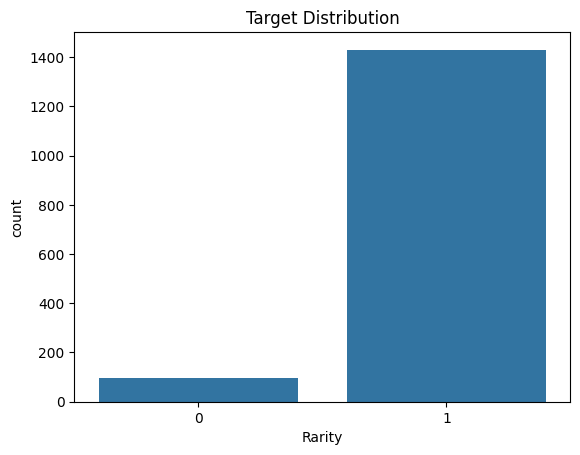

In [93]:

# 1. Is the target imbalanced?
def check_target_imbalance(df, target_column):
    print("Target Distribution:")
    print(df['Rarity'].value_counts(normalize=True))
    sns.countplot(x=df['Rarity'])
    plt.title("Target Distribution")
    plt.show()

check_target_imbalance(df, "Rarity")#it's highly imbalanced


> Created by Hassan Alsayhah:
> [LinkedIn](https://www.linkedin.com/in/hassan-alsayhah-28a83a251/)

In [57]:
# correlation between each feature
sns.pairplot(df)



In [94]:
df=df.drop(columns=['Branch_Code','No'])


In [95]:
df.head()

,Original_Name,Name,Generation,Height,Weight,Type1,Ability1,Color,Gender_Male,Gender_Female,...,Base_Experience,Experience_Type,Rarity,HP,Attack,Defense,SP_Attack,SP_Defense,Speed,Total
0,93,116,1,0.7,6.9,9,129,4,87.5,12.5,...,64,1059860,1,45,49,49,65,65,45,318
1,424,516,1,1.0,13.0,9,129,4,87.5,12.5,...,142,1059860,1,60,62,63,80,80,60,405
2,941,1124,1,2.0,100.0,9,129,4,87.5,12.5,...,263,1059860,1,80,82,83,100,100,80,525
3,941,684,1,2.4,155.5,9,211,4,87.5,12.5,...,281,1059860,1,80,100,123,122,120,80,625
4,123,153,1,0.6,8.5,6,18,7,87.5,12.5,...,62,1059860,1,39,52,43,60,50,65,309


In [96]:
from sklearn.preprocessing import MinMaxScaler
numerical_cols = df.select_dtypes(include=["int64", "float64"]).columns.drop('Rarity')  ### DON'T SCALE THE TARGET
scaler = MinMaxScaler()
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])
df

,Original_Name,Name,Generation,Height,Weight,Type1,Ability1,Color,Gender_Male,Gender_Female,...,Base_Experience,Experience_Type,Rarity,HP,Attack,Defense,SP_Attack,SP_Defense,Speed,Total
0,0.092170,0.096586,0.000,0.006006,0.006901,0.529412,0.537500,0.444444,0.875,0.125,...,0.046745,0.442173,1,0.173228,0.237838,0.179592,0.298913,0.195652,0.205128,0.150526
1,0.420218,0.429642,0.000,0.009009,0.013001,0.529412,0.537500,0.444444,0.875,0.125,...,0.176962,0.442173,1,0.232283,0.308108,0.236735,0.380435,0.260870,0.282051,0.242105
2,0.932607,0.935887,0.000,0.019019,0.100010,0.529412,0.537500,0.444444,0.875,0.125,...,0.378965,0.442173,1,0.311024,0.416216,0.318367,0.489130,0.347826,0.384615,0.368421
3,0.932607,0.569525,0.000,0.023023,0.155516,0.529412,0.879167,0.444444,0.875,0.125,...,0.409015,0.442173,1,0.311024,0.513514,0.481633,0.608696,0.434783,0.384615,0.473684
4,0.121903,0.127394,0.000,0.005005,0.008501,0.352941,0.075000,0.777778,0.875,0.125,...,0.043406,0.442173,1,0.149606,0.254054,0.155102,0.271739,0.130435,0.307692,0.141053
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1522,0.365709,0.368859,0.250,0.008008,0.071507,0.823529,0.879167,0.666667,0.500,0.500,...,0.215359,0.192308,1,0.311024,0.216216,0.244898,0.434783,0.391304,0.384615,0.310526
1523,0.327056,0.333888,0.375,0.004004,0.003900,0.705882,0.433333,0.333333,0.250,0.750,...,0.043406,0.192308,1,0.188976,0.270270,0.151020,0.173913,0.073913,0.410256,0.142105
1524,0.691774,0.722731,0.250,0.069069,0.206521,0.117647,0.012500,0.444444,0.000,0.000,...,0.507513,0.625000,0,0.409449,0.783784,0.346939,0.760870,0.304348,0.461538,0.531579
1525,0.478692,0.480433,0.500,0.010010,0.016302,0.529412,0.091667,0.444444,0.000,1.000,...,0.220367,0.384615,1,0.271654,0.297297,0.285714,0.543478,0.239130,0.435897,0.321053


In [97]:
#target
X = df.drop("Rarity",axis=1)
y = df['Rarity']# target

In [100]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define classification models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "Support Vector Machine": SVC(kernel='rbf'),
    "Decision Tree Classifier": DecisionTreeClassifier(max_depth=5),
    "Random Forest Classifier": RandomForestClassifier(n_estimators=100),
    "XGBoost Classifier": XGBClassifier(verbosity=0),

}
y=y.apply(lambda x:1 if x>0 else 0)

for model_name, model in models.items():
    scores_accuracy = []
    scores_precision = []
    scores_recall = []
    scores_f1 = []

    # Stratified 5-Fold Cross-Validation
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    for train_index, test_index in skf.split(X, y):
        # Split data into training and testing sets
        X_Train, X_Test = X.loc[train_index, :], X.loc[test_index, :]
        y_Train, y_Test = y.iloc[train_index], y.iloc[test_index]
        # Train the model
        model.fit(X_Train, y_Train)
        # Predict on the test set
        y_pred = model.predict(X_Test)

        # Calculate metrics
        scores_accuracy.append(accuracy_score(y_Test, y_pred))
        scores_precision.append(precision_score(y_Test, y_pred, average='weighted'))
        scores_recall.append(recall_score(y_Test, y_pred, average='weighted'))
        scores_f1.append(f1_score(y_Test, y_pred, average='weighted'))

    # Print the results
    print(f"{model_name} Accuracy: {np.mean(scores_accuracy):.4f}")
    print(f"{model_name} Precision: {np.mean(scores_precision):.4f}")
    print(f"{model_name} Recall: {np.mean(scores_recall):.4f}")
    print(f"{model_name} F1-Score: {np.mean(scores_f1):.4f}")
    print("\n")
# we don't use accuracy because the data is highly imbalanced

Logistic Regression Accuracy: 0.9758
Logistic Regression Precision: 0.9773
Logistic Regression Recall: 0.9758
Logistic Regression F1-Score: 0.9760


Support Vector Machine Accuracy: 0.9823
Support Vector Machine Precision: 0.9829
Support Vector Machine Recall: 0.9823
Support Vector Machine F1-Score: 0.9820


Decision Tree Classifier Accuracy: 0.9889
Decision Tree Classifier Precision: 0.9894
Decision Tree Classifier Recall: 0.9889
Decision Tree Classifier F1-Score: 0.9891


Random Forest Classifier Accuracy: 0.9961
Random Forest Classifier Precision: 0.9961
Random Forest Classifier Recall: 0.9961
Random Forest Classifier F1-Score: 0.9960


XGBoost Classifier Accuracy: 0.9974
XGBoost Classifier Precision: 0.9974
XGBoost Classifier Recall: 0.9974
XGBoost Classifier F1-Score: 0.9974


